In [ ]:
"""
 We were using the MTSD dataset : https://www.kaggle.com/datasets/zeuss2k3/mapillary-traffic-sign-dataset
 but its too heavy .
 -----------
 So we decided to use : https://www.kaggle.com/datasets/nomihsa965/traffic-signs-dataset-mapillary-and-dfg
"""

## NOTE : For running this notebook you should download the dataset from :
###    https://www.kaggle.com/datasets/nomihsa965/traffic-signs-dataset-mapillary-and-dfg
##    and then put it in the main directory (Argos/) by "data" naming

In [ ]:
# Input data files are available in the read-only "../data/" directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))


# Explore Dataset Argos Project: Traffic Sign Detection

**University of Tehran**

**Author:** *MahdiHaji*

**Subject:** *CPS*



In [3]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import glob

import shutil
import sys
from IPython.display import display
from joblib import Parallel, delayed
from tqdm.notebook import tqdm 
tqdm.pandas()
from sklearn.model_selection import train_test_split


# 📖 Meta Data
* `crops/` - Folder containing images of traffic signs that have been cut from the original images and divided into 76 folders corresponding to 76 types of traffic signs.

* `images/` - Folder containing set photos of the form `image_name.jpg`

* `txts (YOLO)/` - All label for photos of the form `image_name.txt`, each label is 
form

`[label object] [x_center] [y_center] [width] [height]` with scale (0,1)

* `xmls/` - All label for photos of the form `image_name.txt`

* `classes.json` - containing a list of all classes with information about class name, class index and number of instances in the dataset.

* `dataset.yaml` - yolo's dataset settings


# ✏️ Write Images
* We need to copy the Images to Current Directory(`/kaggle/working`) as `/kaggle/input` doesn't have **write access** which is needed for **YOLOv5**.
* We can make this process faster using **Joblib** which uses **Parallel** computing.

In [21]:
## @title Get image name
PATH = '../data'
list_img=[img for img in os.listdir(PATH+'/images')]
list_txt=[img for img in os.listdir(PATH+'/txts (YOLO)')]

path_img=[]
for i in range (len(list_img)):
    path_img.append(PATH+'/images/'+list_img[i])


path_label=[]
for i in range (len(list_txt)):
    arr = [PATH+'/txts (YOLO)/'+list_txt[i], ]
    path_label.append(PATH+'/txts (YOLO)/'+list_txt[i])

In [22]:
df = pd.DataFrame(path_img)

In [23]:
df

,0
0,../data/images/0010010.jpg
1,../data/images/-1ZXiNNunp0TA-puToNbeQ.jpg
2,../data/images/TtH4hYk8DSfmgb0omrdUWA.jpg
3,../data/images/0000203.jpg
4,../data/images/Jw6diCiDRA_s7QJ71hy-Yg.jpg
...,...
19341,../data/images/7KpbGD6xXhocK83WLKU6aA.jpg
19342,../data/images/0010009.jpg
19343,../data/images/JXvJr1vwTqwvKH7vBMeVrg.jpg
19344,../data/images/0007575.jpg


In [24]:
dfl = pd.DataFrame(path_label)

In [25]:
dfl

,0
0,../data/txts (YOLO)/0005047.txt
1,../data/txts (YOLO)/0015254.txt
2,../data/txts (YOLO)/0003436.txt
3,../data/txts (YOLO)/0004359.txt
4,../data/txts (YOLO)/0013625.txt
...,...
19043,../data/txts (YOLO)/0000126.txt
19044,../data/txts (YOLO)/0014153.txt
19045,../data/txts (YOLO)/3qf88IGrJRd8pNl1ShzqQQ.txt
19046,../data/txts (YOLO)/0012522.txt


## Make DataFrame image and label

In [54]:
PATH_TXT = "../data/txts (YOLO)/"
metadata = {'image': [],
            'x_center': [],
            'y_center': [],
            'w': [],
            'h': [],
            'class': [],
            'num_labels': []}

for file in path_label:
    f = open(file, "r")
    labels = f.read().split('\n')[:-1]
    filerp = file[:]
    for label in labels:
    
        lis = label.split(" ")
        metadata['num_labels'].append(len(labels))
        metadata['image'].append(PATH+"/images/"+file.split("/")[-1][:-3]+'jpg')
        metadata['x_center'].append(float(lis[1]))
        metadata['y_center'].append(float(lis[2]))
        metadata['w'].append(float(lis[3]))
        metadata['h'].append(float(lis[4]))
        metadata['class'].append(int(lis[0]))

In [55]:
df = pd.DataFrame(metadata)

In [56]:
df

,image,x_center,y_center,w,h,class,num_labels
0,../data/images/0005047.jpg,0.790365,0.401852,0.078646,0.142593,28,2
1,../data/images/0005047.jpg,0.795573,0.248148,0.077604,0.138889,21,2
2,../data/images/0015254.jpg,0.887592,0.524272,0.031941,0.061489,59,2
3,../data/images/0015254.jpg,0.809275,0.476537,0.048526,0.064725,1,2
4,../data/images/0003436.jpg,0.788281,0.508796,0.169271,0.056481,47,1
...,...,...,...,...,...,...,...
30553,../data/images/3qf88IGrJRd8pNl1ShzqQQ.jpg,0.707465,0.515873,0.005704,0.009921,0,1
30554,../data/images/0012522.jpg,0.462224,0.287217,0.123464,0.165049,50,3
30555,../data/images/0012522.jpg,0.234029,0.254854,0.128993,0.139159,46,3
30556,../data/images/0012522.jpg,0.833538,0.095874,0.100737,0.125405,18,3


## `x_center` vs `y_center`

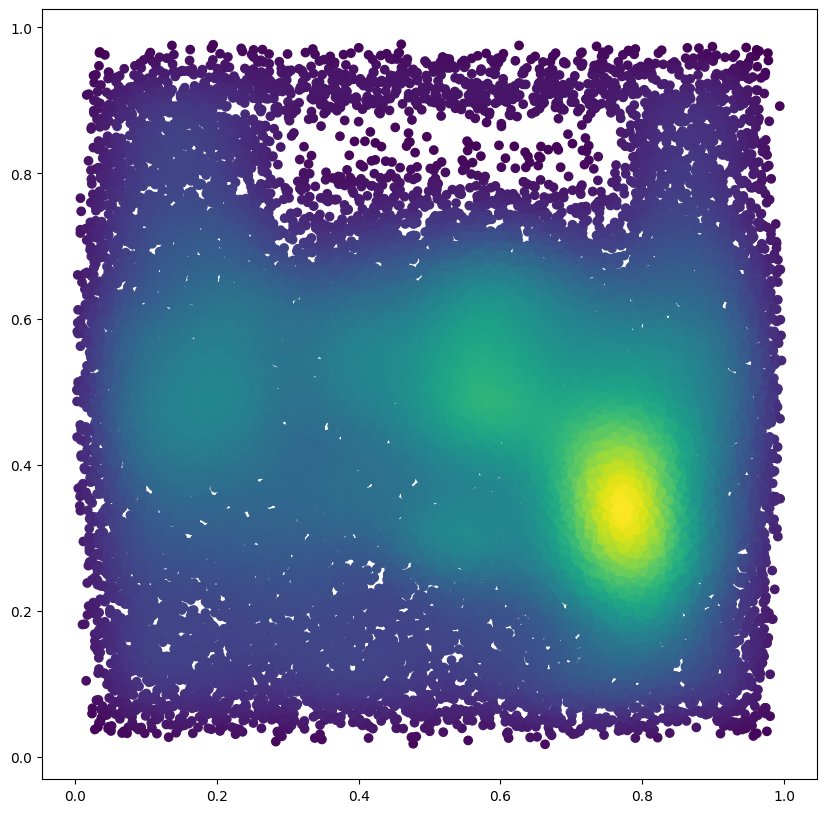

In [57]:
from scipy.stats import gaussian_kde


x_val = df['x_center'].values
y_val = df['y_center'].values

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
ax.scatter(x_val, y_val, c=z, cmap='viridis')
# ax.set_xlabel('x_mid')
# ax.set_ylabel('y_mid')
plt.show()

## `width` Vs `height`

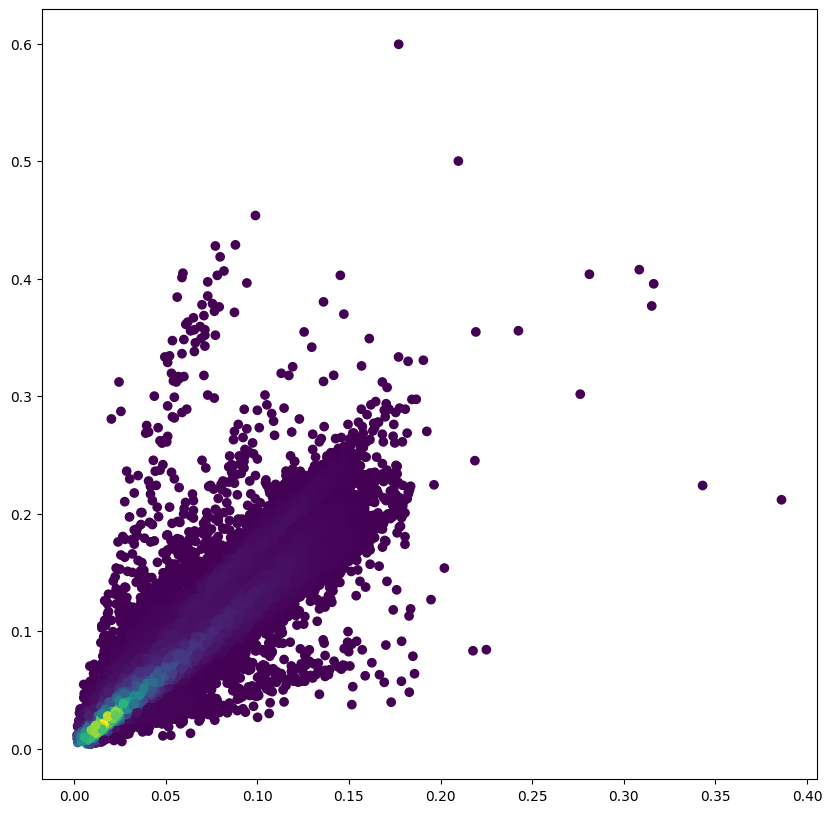

In [58]:
w_val = df['w'].values
h_val = df['h'].values

# Calculate the point density
wh = np.vstack([w_val,h_val])
z = gaussian_kde(wh)(wh)

fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
ax.scatter(w_val, h_val, c=z, cmap='viridis')
# ax.set_xlabel('bbox_width')
# ax.set_ylabel('bbox_height')
plt.show()

## Number of each class

<BarContainer object of 76 artists>

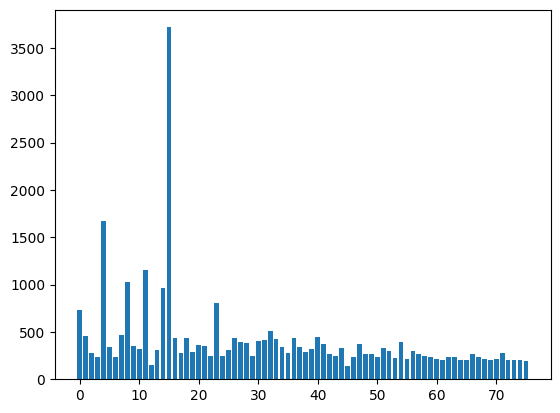

In [59]:
cls = df['class'].value_counts()
x = np.arange(len(cls))
y = []
for i in range(len(cls)):
    y.append(cls[i])
plt.bar(x,y)

## 🌈 Visualization

In [67]:
PATH_TXT = "../data/txts (YOLO)"
metadata = {'image': [],
            'label': []}

for i, file in enumerate(path_label):
    f = open(file, "r")
    labels = f.read().split('\n')[:-1]
    filel = file.split('/')
    metadata['image'].append(PATH+'/images/'+filel[3][:-3]+'jpg')
    metadata['label'].append(file)

In [68]:
df = pd.DataFrame(metadata)

In [69]:
df

,image,label
0,../data/images/0005047.jpg,../data/txts (YOLO)/0005047.txt
1,../data/images/0015254.jpg,../data/txts (YOLO)/0015254.txt
2,../data/images/0003436.jpg,../data/txts (YOLO)/0003436.txt
3,../data/images/0004359.jpg,../data/txts (YOLO)/0004359.txt
4,../data/images/0013625.jpg,../data/txts (YOLO)/0013625.txt
...,...,...
19043,../data/images/0000126.jpg,../data/txts (YOLO)/0000126.txt
19044,../data/images/0014153.jpg,../data/txts (YOLO)/0014153.txt
19045,../data/images/3qf88IGrJRd8pNl1ShzqQQ.jpg,../data/txts (YOLO)/3qf88IGrJRd8pNl1ShzqQQ.txt
19046,../data/images/0012522.jpg,../data/txts (YOLO)/0012522.txt


In [70]:
import json
f = open('../data/classes.json')
data = json.load(f)
f.close()

labels = {}
for label in data:
    labels[data[label]['classIndex']] = label


In [73]:
!pip3 install pybboxes
import pybboxes as pbx


[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: pip3 install --upgrade pip


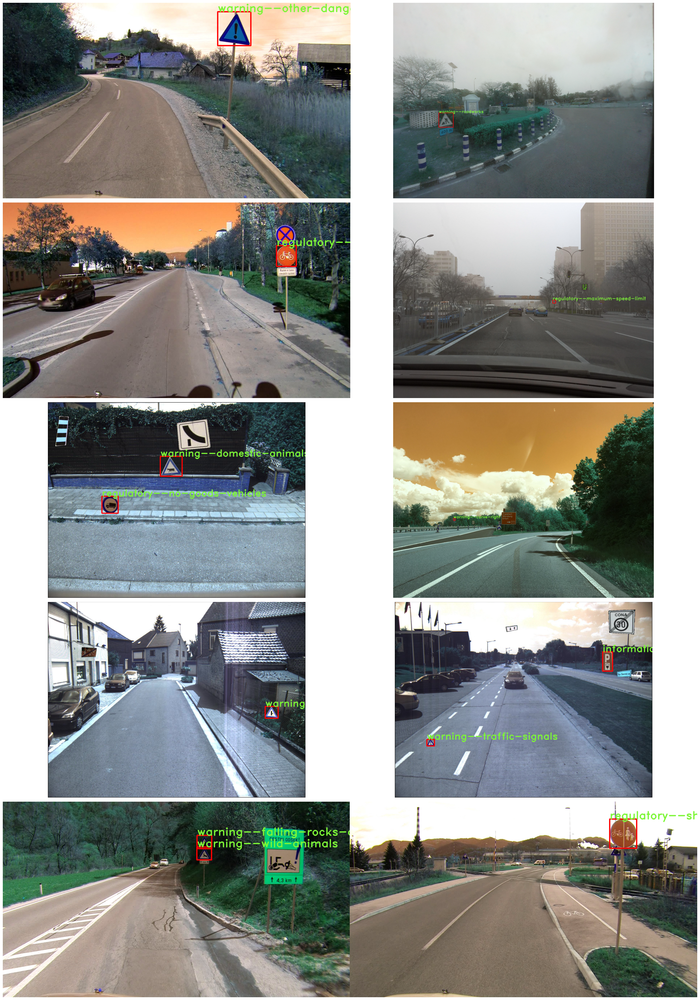

In [75]:
df2 = df.sample(20) # takes samples with bbox
y = 5; x = 2
plt.figure(figsize=(12.8*x, 7.2*y))
for idx in range(x*y):
    row = df2.iloc[idx]
    img = cv2.imread(row.image)
    dh, dw, _ = img.shape
    fl = open(row.label, 'r')
    data = fl.readlines()
    fl.close()

    for dt in data:
        cl, xc, yc, w, h = map(float, dt.split(' '))
        box_voc = pbx.convert_bbox((xc,yc,w,h), from_type="yolo", to_type="voc", image_size=(dw, dh))
        cv2.rectangle(img, (box_voc[0], box_voc[1]), (box_voc[2], box_voc[3]), (255, 0, 0), 5)
        img = cv2.putText(
          img = img,
          text = labels[cl],
          org = (box_voc[0], box_voc[1]),
          fontFace = cv2.FONT_HERSHEY_DUPLEX,
          fontScale = 2.0,
          color = (125, 246, 55),
          thickness = 3
        )
    plt.subplot(y, x, idx+1)
    plt.imshow(img)
    plt.axis('OFF')
plt.tight_layout()
plt.show()

## Split dataset